In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
!pip install --quiet scvi-colab
from scvi_colab import install
install()

/home/chels/anaconda3/envs/thesis/lib/python3.8/site-packages/scvi_colab/_core.py:41: UserWarning: 
                Not currently in Google Colab environment.

                Please run with `run_outside_colab=True` to override.

                Returning with no further action.
                
  warn(


In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import scvelo as scv
import torch
import scarches as sca
import matplotlib.pyplot as plt
import seaborn as sns
import argparse
from velovi import VELOVI


Global seed set to 0
/home/chels/anaconda3/envs/thesis/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/chels/anaconda3/envs/thesis/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [14]:
#Choose dataset
dataset = "pbmc"

#Choose model to train
model = "divelo"

if dataset == "pbmc":
    cell_column = 'celltype'
elif dataset == "pancreas":
    cell_column = 'clusters'
elif dataset == "dentategyrus":
    cell_column = 'clusters'
elif dataset == "hindbrain":
    cell_column = 'Celltype'

In [15]:
adata_file = "data/" + dataset + "/" + dataset + "_data_annotations.h5ad" #preprocessed data
adata_output = "data/" + dataset + "/" + model + "/data_output.h5ad" #path so save output adata after training model
metrics_dict = "output/" + dataset + "/" + model + "/latent_analysis.pkl"

In [16]:
adata = sc.read(adata_file)

### Hyperparameter optimization with W&B

In [7]:
import wandb
wandb.login()

ERROR:wandb.jupyter:Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: chelseabright. Use `wandb login --relogin` to force relogin


True

In [8]:
import scib
from pytorch_lightning.loggers import WandbLogger
#parser = argparse.ArgumentParser()

#parser.add_argument("adata_file", default="data/Pancreas/pancreas_data_annotations.h5ad")
#parser.add_argument("adata_output", default="data/Pancreas/pancreas_data_output.h5ad")

#args = parser.parse_args()

#adata_file = args.adata_file
#adata_output = args.adata_output

print(adata_file)

adata = sc.read(adata_file)

adata_train = adata.copy()
    
sweep_config = {
  "method": "bayes",  
  "metric": {           
      "name": "validation_loss",
      "goal": "minimize"
  },
  "parameters": {
        "n_layers": {
            # Choose from pre-defined values
            "values": [1,2,3]
        },

        "lr":  {'max': 0.01, 'min': 0.0001},
      
        "dropout_rate": {"values" : [0.1, 0.3, 0.5, 0.7]},
      
        "alpha_GP" : {"values" : [0.1, 0.3, 0.5, 0.7, 0.8, 0.9, 1]},
      
        "alpha_kl" : {'max': 1.0, 'min': 0.01},

        "batch_size" : {"values" : [64, 128, 256]},

        
    },
    
    "early_terminate" : {"type": "hyperband", "min_iter": 20}
}

sweep_id = wandb.sweep(sweep_config, project="divelo")

def sweep_iteration():

    adata_train = adata.copy()

    wandb.init()    
    wandb_logger = WandbLogger()

    VELOVI.setup_anndata(adata_train, spliced_layer="Ms", unspliced_layer="Mu")

    omega_reactome=torch.ones(adata.varm["I"][:,50:].shape[1])
    omega_panglao=torch.zeros(adata.varm["I"][:,:50].shape[1])
    omega=torch.cat((omega_panglao,omega_reactome))

    vae = VELOVI(
        adata=adata_train,
        n_layers=wandb.config.n_layers,
        dropout_rate=wandb.config.dropout_rate,
        
        
    )

    trainer_kwargs={"logger": wandb_logger}

    vae.train(
        max_epochs=800,
        lr=wandb.config.lr,
        alpha_GP=wandb.config.alpha_GP,
        omega=omega,
        alpha_kl=wandb.config.alpha_kl,
        batch_size=wandb.config.batch_size,
        **trainer_kwargs
    )

    adata.obsm["latent"] = vae.get_latent()
    sc.pp.neighbors(adata, use_rep="latent")

    #calculate velocity confidence
    # latent_time = vae.get_latent_time(n_samples=25)
    # velocities = vae.get_velocity(n_samples=25, velo_statistic="mean")
    # t = latent_time
    # scaling = 20 / t.max(0)

    # adata.layers["velocity"] = velocities / scaling
    # adata.layers["latent_time_velovi"] = latent_time
    # scv.tl.velocity_graph(adata, n_jobs=10)
    # scv.tl.velocity_confidence(adata)
    # vel_conf=adata.obs["velocity_confidence"]
    
    scib.metrics.cluster_optimal_resolution(adata, cluster_key="cluster", label_key=cell_column)
    wandb.log({#"mean vel conf": np.mean(vel_conf), 
              "nmi": scib.metrics.nmi(adata, group1="cluster", group2=cell_column), 
              "ari": scib.me.ari(adata, group1="cluster", group2=cell_column), 
              "asw": scib.me.silhouette(adata, group_key=cell_column, embed="latent"),
              "clust_avg" : (scib.metrics.nmi(adata, group1="cluster", group2=cell_column)+scib.me.ari(adata, group1="cluster", group2=cell_column)+scib.me.silhouette(adata, group_key=cell_column, embed="latent"))/3,
              #"metrics_avg" : (np.mean(vel_conf)+scib.metrics.nmi(adata, group1="cluster", group2=cell_column)+scib.me.ari(adata, group1="cluster", group2=cell_column)+scib.me.silhouette(adata, group_key=cell_column, embed="latent"))/4
             })
    
    
wandb.agent(sweep_id, function=sweep_iteration, count=200)
wandb.finish()

data/hindbrain/hindbrain_data_annotations.h5ad
Create sweep with ID: 52eun4f2
Sweep URL: https://wandb.ai/chelseabright/divelo/sweeps/52eun4f2


/home/mo/miniconda3/envs/ivelo/lib/python3.8/site-packages/wandb/sdk/wandb_setup.py:268: ResourceWarning: unclosed <socket.socket fd=66, family=AddressFamily.AF_INET, type=SocketKind.SOCK_STREAM, proto=0, laddr=('127.0.0.1', 57008), raddr=('127.0.0.1', 54841)>
  self._manager = None
wandb: Agent Starting Run: yr7i9s51 with config:
wandb: 	alpha_GP: 0.7
wandb: 	alpha_kl: 0.402681688725178
wandb: 	batch_size: 256
wandb: 	dropout_rate: 0.5
wandb: 	lr: 0.00404919264422187
wandb: 	n_layers: 2
ERROR:wandb.jupyter:Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
/home/mo/miniconda3/envs/ivelo/lib/python3.8/site-packages/wandb/sdk/wandb_setup.py:238: ResourceWarning: unclosed file <_io.TextIOWrapper name='/home/mo/projects/chelsea/velo_interpret/velovi/wandb/sweep-52eun4f2/config-yr7i9s51.yaml' mode='r' encoding='UTF-8'>
  self._sweep_config = config_util.dict_from_config_file(
/home/mo/miniconda3/envs/

/home/mo/miniconda3/envs/ivelo/lib/python3.8/site-packages/pytorch_lightning-1.8.6-py3.8.egg/pytorch_lightning/loggers/wandb.py:396: UserWarning: There is a wandb run already in progress and newly created instances of `WandbLogger` will reuse this run. If this is not desired, call `wandb.finish()` before instantiating `WandbLogger`.
  rank_zero_warn(
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Last Decoder layer: softmax
Epoch 1/800:   0%|          | 0/800 [00:00<?, ?it/s]Init the group lasso proximal operator for the main terms.


/home/mo/miniconda3/envs/ivelo/lib/python3.8/site-packages/scvi_tools-0.20.0a0-py3.8.egg/scvi/module/base/_base_module.py:67: DeprecationWarning: LossRecorder is deprecated and will be removed in version 0.20.0. Please use LossOutput
  warnings.warn(


Epoch 343/800:  43%|████▎     | 343/800 [04:26<05:55,  1.29it/s, loss=-1.79e+03, v_num=9s51]
Monitored metric elbo_validation did not improve in the last 45 records. Best score: -1699.386. Signaling Trainer to stop.


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


### Train model with optimal hyperparameters

In [10]:
adata

AnnData object with n_obs × n_vars = 3696 × 564
    obs: 'clusters_coarse', 'clusters', 'S_score', 'G2M_score', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts'
    var: 'highly_variable_genes', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes'
    uns: 'clusters_coarse_colors', 'clusters_colors', 'day_colors', 'neighbors', 'pca', 'terms', 'velocity_params'
    obsm: 'X_pca', 'X_umap'
    varm: 'I'
    layers: 'Ms', 'Mu', 'spliced', 'unspliced', 'velocity'
    obsp: 'connectivities', 'distances'

In [ ]:
adata = sc.read(adata_file)

adata_train = adata.copy()

config={ "alpha_GP" : 1,
        "alpha_kl" : 0.4,
        "batch_size" : 64,
        "dropout_rate" : 0.7,
        "lr" : 0.006,
        "n_layers" : 1,
        "early_stopping_patience":80,
        "alpha_l1" : 0.9
        
       }

alpha_l1_list =[0.06, 0.1, 0.2, 0.4, 0.8]
        

VELOVI.setup_anndata(adata_train, spliced_layer="Ms", unspliced_layer="Mu")

omega=None
if dataset != "pbmc":
    omega_reactome=torch.ones(adata.varm["I"][:,50:].shape[1])
    omega_panglao=torch.zeros(adata.varm["I"][:,:50].shape[1])
    omega=torch.cat((omega_panglao,omega_reactome))

for alpha_l1 in alpha_l1_list:
    vae = VELOVI(
        adata=adata_train,
        n_layers=config["n_layers"],
        dropout_rate=config["dropout_rate"],
        soft_mask=True


    )


    vae.train(
        max_epochs=50,
        lr=config["lr"],
        alpha_GP=config["alpha_GP"],
        omega=omega,
        alpha_l1=alpha_l1,
        alpha_kl=config["alpha_kl"],
        batch_size=config["batch_size"],
        early_stopping_patience=config["early_stopping_patience"]
    )

In [13]:
adata = sc.read(adata_file)

adata_train = adata.copy()

config={ "alpha_GP" : 1,
        "alpha_kl" : 0.4,
        "batch_size" : 64,
        "dropout_rate" : 0.7,
        "lr" : 0.006,
        "n_layers" : 1,
        "early_stopping_patience":80,
        "alpha_l1" : 0.9
        
       }
        

VELOVI.setup_anndata(adata_train, spliced_layer="Ms", unspliced_layer="Mu")

omega=None
if dataset != "pbmc":
    omega_reactome=torch.ones(adata.varm["I"][:,50:].shape[1])
    omega_panglao=torch.zeros(adata.varm["I"][:,:50].shape[1])
    omega=torch.cat((omega_panglao,omega_reactome))

vae = VELOVI(
    adata=adata_train,
    n_layers=config["n_layers"],
    dropout_rate=config["dropout_rate"],
    soft_mask=True


)


vae.train(
    max_epochs=50,
    lr=config["lr"],
    alpha_GP=config["alpha_GP"],
    omega=omega,
    alpha_l1=config["alpha_l1"],
    alpha_kl=config["alpha_kl"],
    batch_size=config["batch_size"],
    early_stopping_patience=config["early_stopping_patience"]
)



Last Decoder layer: softmax


GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


Epoch 1/50:   0%|          | 0/50 [00:00<?, ?it/s]Init the group lasso proximal operator for the main terms.
Init the soft mask proximal operator for the main terms.

Number of deactivated terms: 0
-------------------
Share of deactivated inactive genes: 0.0000
-------------------
True

Number of deactivated terms: 0
-------------------
Share of deactivated inactive genes: 0.0000
-------------------
True

Number of deactivated terms: 0
-------------------
Share of deactivated inactive genes: 0.0000
-------------------
True

Number of deactivated terms: 0
-------------------
Share of deactivated inactive genes: 0.0000
-------------------
True

Number of deactivated terms: 0
-------------------
Share of deactivated inactive genes: 0.0000
-------------------
True

Number of deactivated terms: 0
-------------------
Share of deactivated inactive genes: 0.0000
-------------------
True
Epoch 2/50:   2%|▏         | 1/50 [00:17<14:40, 17.97s/it, loss=961, v_num=1]
Number of deactivated terms: 0

`Trainer.fit` stopped: `max_epochs=50` reached.


Epoch 50/50: 100%|██████████| 50/50 [10:54<00:00, 13.08s/it, loss=-361, v_num=1]


In [8]:
vae.save("trained_models/" + dataset + "/" + model) 

In [23]:
#Load model
adata = sc.read(adata_output)
vae=VELOVI.load("trained_models/" + dataset + "/" + model, adata)

INFO     File trained_models/hindbrain/divelo/model.pt already downloaded                                          
Last Decoder layer: softmax


In [25]:
adata.obsm["X_" + model + "_opt_all"] = vae.get_latent()
adata.obsm["X_" + model + "_opt_active"] = vae.get_latent(only_active=True)

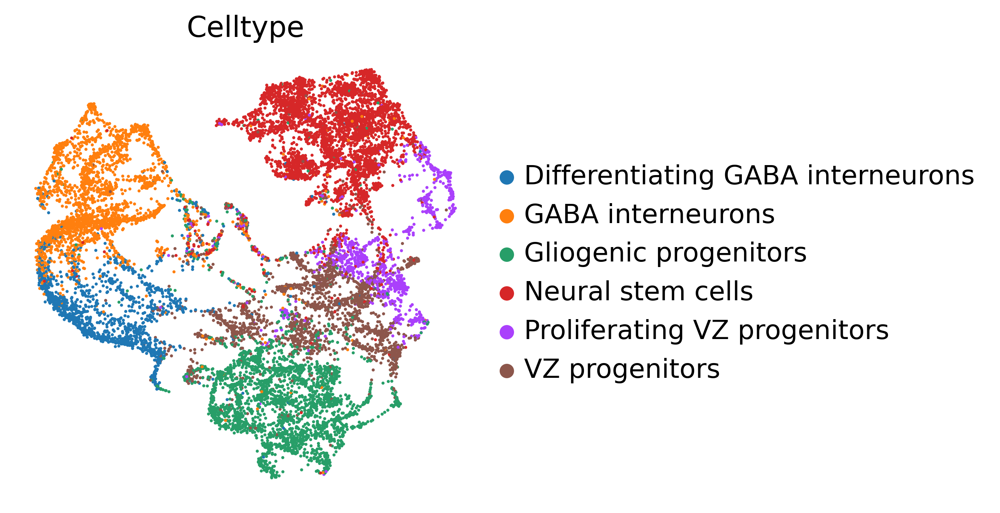

In [27]:
sc.pp.neighbors(adata, use_rep="X_" + model + "_opt_all")
sc.tl.umap(adata)
#sc.pl.umap(adata, color='clusters', frameon=False, save="_" + model + "_opt_all.png")

sc.pp.neighbors(adata, use_rep="X_" + model + "_opt_active")
sc.tl.umap(adata)
sc.pl.umap(adata, color=cell_column, frameon=False, save="_" + model + "_opt_active.png")

In [17]:
def add_velovi_outputs_to_adata(adata, vae):
    latent_time = vae.get_latent_time(n_samples=25)
    velocities = vae.get_velocity(n_samples=25, velo_statistic="mean")

    t = latent_time
    scaling = 20 / t.max(0)

    adata.layers["velocity"] = velocities / scaling
    adata.layers["latent_time_velovi"] = latent_time

    adata.var["fit_alpha"] = vae.get_rates()["alpha"] / scaling
    adata.var["fit_beta"] = vae.get_rates()["beta"] / scaling
    adata.var["fit_gamma"] = vae.get_rates()["gamma"] / scaling
    adata.var["fit_t_"] = (
        torch.nn.functional.softplus(vae.module.switch_time_unconstr)
        .detach()
        .cpu()
        .numpy()
    ) * scaling
    adata.layers["fit_t"] = latent_time.values * scaling[np.newaxis, :]
    adata.var['fit_scaling'] = 1.0

add_velovi_outputs_to_adata(adata, vae)

In [18]:
import pickle
with open(metrics_dict, 'rb') as f:
    metrics=pickle.load(f)

metrics["adata"] = adata

In [19]:
#save dictionary to pkl
import pickle
with open(metrics_dict, 'wb') as f:
    pickle.dump(metrics, f)

In [28]:
scv.tl.velocity_graph(adata, n_jobs=10)
scv.tl.velocity_confidence(adata)
vel_conf=adata.obs["velocity_confidence"]

computing velocity graph (using 10/12 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)


In [11]:
vel_conf

E10_AAACCTGCAAGCTGAG    0.940501
E10_AAACCTGCAGACGCTC    0.913160
E10_AAACCTGCATCGATGT    0.930637
E10_AAACCTGCATGTCGAT    0.873369
E10_AAACCTGCATTTGCCC    0.897030
                          ...   
P14_TTGTAGGGTGCTGTAT    0.934090
P14_TTTATGCTCGGTTAAC    0.915136
P14_TTTGGTTAGCGTTTAC    0.922984
P14_TTTGGTTAGGGTTTCT    0.859399
P14_TTTGTCAGTGCCTGTG    0.905391
Name: velocity_confidence, Length: 13501, dtype: float64

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_vel_embedding_pancreasdivelo.png


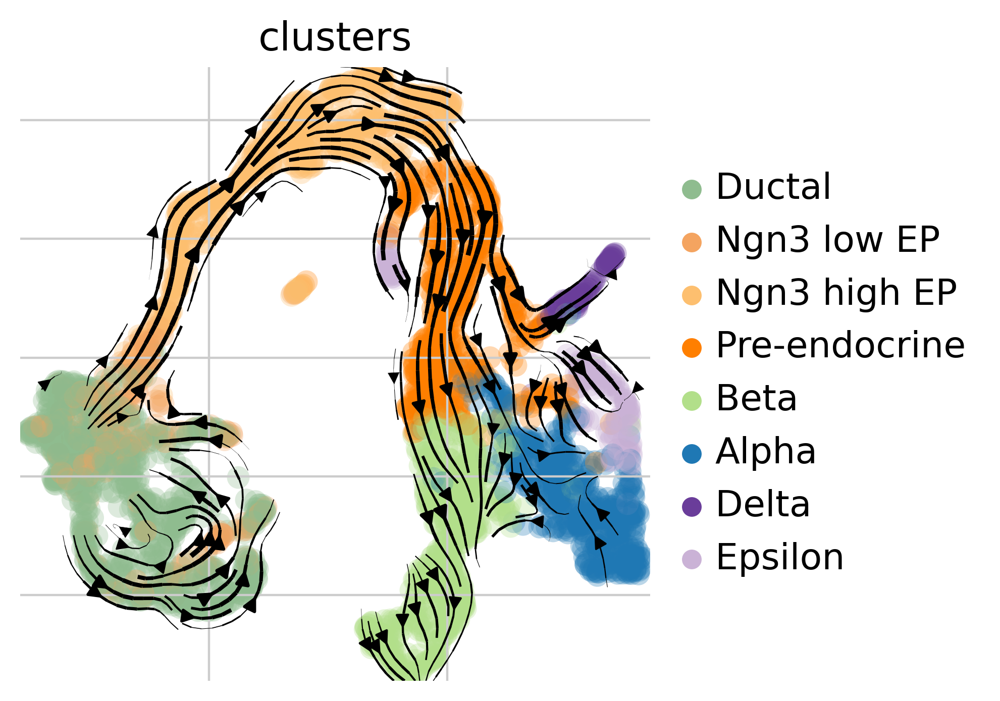

In [33]:
if dataset=="hindbrain":
    scv.pl.velocity_embedding_stream(adata, basis='tsne', color=cell_column, legend_loc="right margin", save="vel_embedding_" + dataset + model + ".png")
else:
    scv.pl.velocity_embedding_stream(adata, basis='umap', color=cell_column, legend_loc="right margin", save="vel_embedding_" + dataset + model + ".png")

saving figure to file ./figures/scvelo_genewise_vel_hindbraindivelo.png


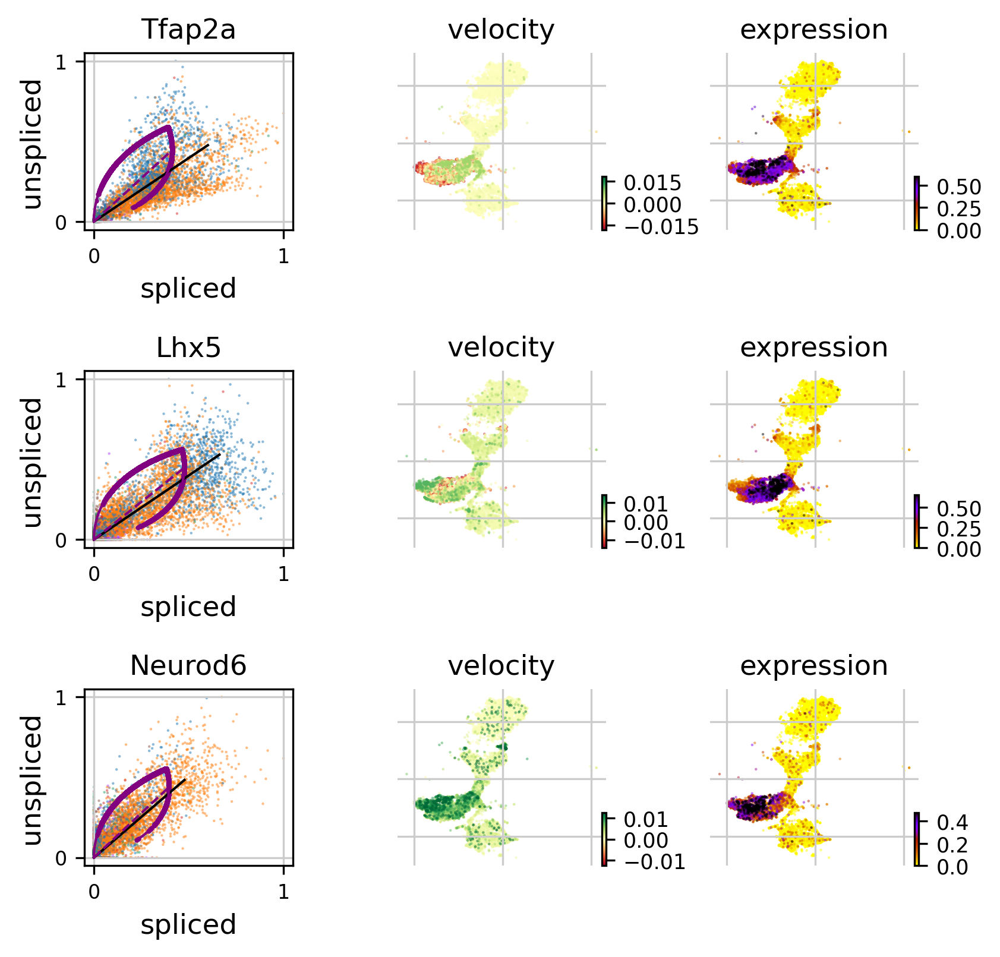

In [13]:
scv.pl.velocity(
    adata,
    var_names=["Tfap2b", "Tfap2a", "Lhx5", "Neurod6"],
    basis="tsne",
    color=cell_column,
    dpi=150,
    save="genewise_vel_" + dataset + model + ".png"
)

In [18]:
adata

AnnData object with n_obs × n_vars = 13501 × 639
    obs: 'TotalUMIs', 'barcode', 'Celltype', 'Lineage', 'Timepoint', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_length', 'velocity_confidence', 'velocity_confidence_transition'
    var: 'Accession', 'AccessionVersion', 'Aliases', 'CcdsID', 'Chromosome', 'ChromosomeEnd', 'ChromosomeStart', 'CosmicID', 'DnaBindingDomain', 'FullName', 'GeneType', 'HgncID', 'IsTFi (TcoF-DB)', 'Location', 'LocationSortable', 'LocusGroup', 'LocusType', 'MgdID', 'MirBaseID', 'OmimID', 'PubmedID', 'RefseqID', 'Regulates (TRRUST)', 'RgdID', 'Strand', 'UcscID', 'UniprotID', 'VegaID', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'velocity_gamma', 'velocity_qreg_ratio', 'velocity_r2', 'velocity_genes', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_scaling'
    uns: 'neighbors', 'pca', 'terms', 'velocity_params', 'velocity_graph', 'velocity_graph_neg',

computing terminal states
    identified 0 region of root cells and 1 region of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
running PAGA using priors: ['velocity_pseudotime']
    finished (0:00:02) --> added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns)
    'paga/transitions_confidence', velocity transitions (adata.uns)
saving figure to file ./figures/scvelo_paga_hindbraindivelo.png


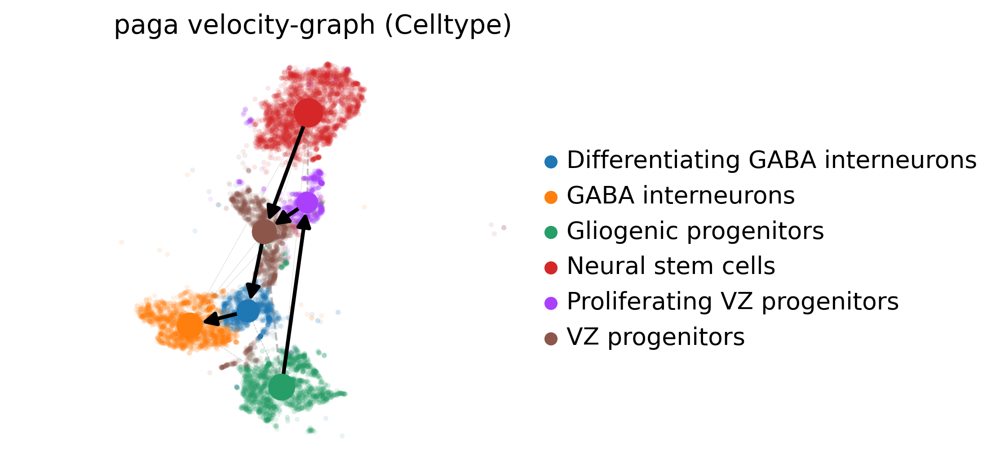

In [14]:
# trajectory inference
adata.uns["neighbors"]["distances"] = adata.obsp["distances"]
adata.uns["neighbors"]["connectivities"] = adata.obsp["connectivities"]
scv.tl.paga(adata, groups=cell_column)
scv.pl.paga(
    adata,
    basis="tsne",
    size=30,
    alpha=0.1,
    min_edge_width=2,
    node_size_scale=1,
    dpi=150,
    save="paga_" + dataset + model + ".png"
)

Uncertainty

In [15]:
uncertainty_df, _ = vae.get_directional_uncertainty(n_samples=100)
uncertainty_df.head()

INFO     velovi: Sampling from model...                                                                            
INFO     velovi: Computing the uncertainties...                                                                    


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    3.3s
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
[Parallel(n_jobs=-1)]: Done 128 tasks      | elapsed:   10.8s
Global seed set to 0
Global seed set to 0
Global seed set to 0
[Parallel(n_jobs=-1)]: Done 2186 tasks      | elapsed:   13.6s
[Parallel(n_jobs=-1)]: Done 5732 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 10340 tasks      | elapsed:   21.6s
[Parallel(n_jobs=-1)]: Done 13501 out of 13501 | elapsed:   24.5s finished


,directional_variance,directional_difference,directional_cosine_sim_variance,directional_cosine_sim_difference,directional_cosine_sim_mean
E10_AAACCTGCAAGCTGAG,0.005632,0.251469,0.003598,0.200588,0.602625
E10_AAACCTGCAGACGCTC,0.005369,0.239562,0.003363,0.189262,0.615510
E10_AAACCTGCATCGATGT,0.004772,0.239298,0.003022,0.189582,0.607050
E10_AAACCTGCATGTCGAT,0.004461,0.227184,0.003002,0.186597,0.562451
E10_AAACCTGCATTTGCCC,0.004167,0.190612,0.002868,0.155348,0.573355


In [16]:
for c in uncertainty_df.columns:
    adata.obs[c] = np.log10(uncertainty_df[c].values)

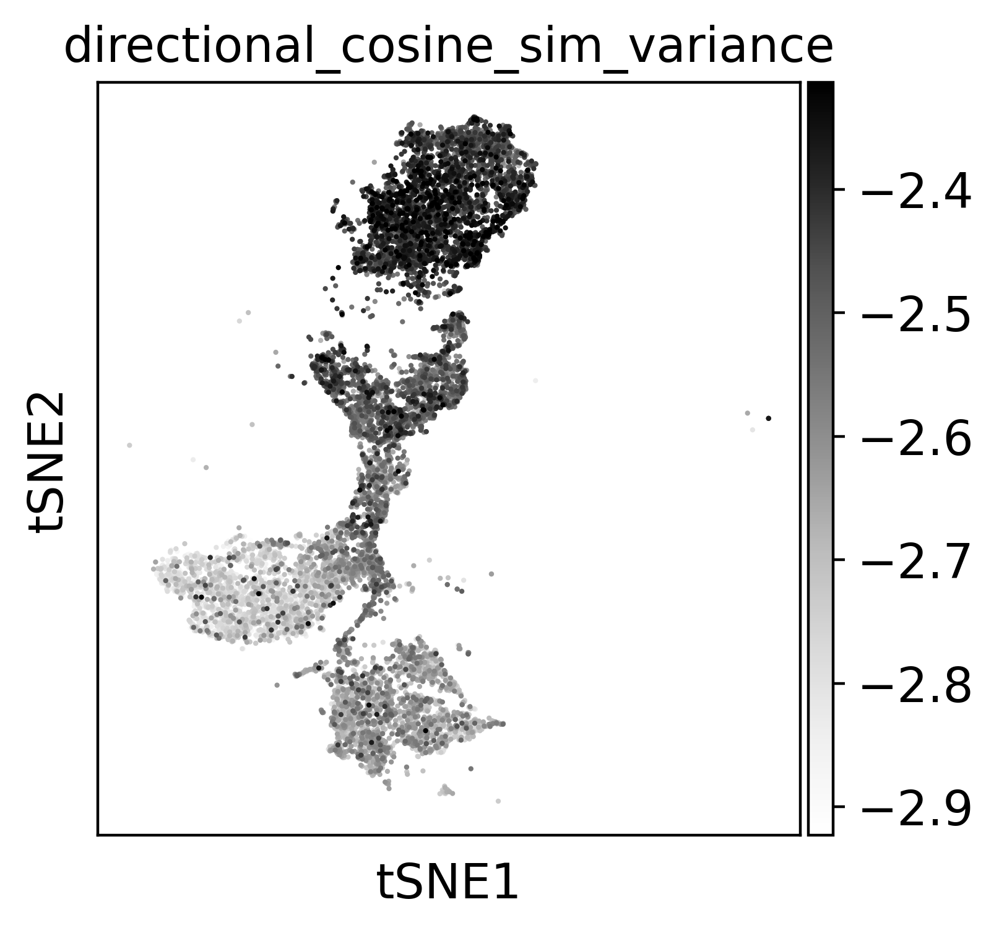

In [19]:
if dataset=="hindbrain":
    sc.pl.tsne(adata, color='directional_cosine_sim_variance', 
        cmap="Greys",
        vmin="p1",
        vmax="p99",
        save="_intrinsic_" + dataset + model + ".png")
else:
    sc.pl.umap(
        adata, 
        color="directional_cosine_sim_variance",
        cmap="Greys",
        vmin="p1",
        vmax="p99",
        save="_intrinsic_" + dataset + model + ".png"
    )

### Extrinsic uncertainty

In [20]:
def compute_extrinisic_uncertainty(adata, vae, n_samples=25) -> pd.DataFrame:
    from velovi._model import _compute_directional_statistics_tensor
    from scvi.utils import track
    from contextlib import redirect_stdout
    import io

    extrapolated_cells_list = []
    for i in track(range(n_samples)):
        with io.StringIO() as buf, redirect_stdout(buf):
            vkey = "velocities_velovi_{i}".format(i=i)
            v = vae.get_velocity(n_samples=1, velo_statistic="mean")
            adata.layers[vkey] = v
            scv.tl.velocity_graph(adata, vkey=vkey, sqrt_transform=False, approx=True)
            t_mat = scv.utils.get_transition_matrix(
                adata, vkey=vkey, self_transitions=True, use_negative_cosines=True
            )
            extrapolated_cells = np.asarray(t_mat @ adata.layers["Ms"])
            extrapolated_cells_list.append(extrapolated_cells)
    extrapolated_cells = np.stack(extrapolated_cells_list)
    df, _ = _compute_directional_statistics_tensor(extrapolated_cells, n_jobs=-1, n_cells=adata.n_obs)
    return df

In [21]:
ext_uncertainty_df = compute_extrinisic_uncertainty(adata, vae)

Working...:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:   4%|▍         | 1/25 [00:06<02:40,  6.68s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:   8%|▊         | 2/25 [00:13<02:29,  6.52s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  12%|█▏        | 3/25 [00:19<02:26,  6.66s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  16%|█▌        | 4/25 [00:26<02:21,  6.75s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  20%|██        | 5/25 [00:33<02:16,  6.83s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  24%|██▍       | 6/25 [00:40<02:11,  6.89s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  28%|██▊       | 7/25 [00:47<02:03,  6.86s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  32%|███▏      | 8/25 [00:54<01:54,  6.74s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  36%|███▌      | 9/25 [01:00<01:48,  6.76s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  40%|████      | 10/25 [01:07<01:42,  6.80s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  44%|████▍     | 11/25 [01:14<01:35,  6.82s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  48%|████▊     | 12/25 [01:21<01:29,  6.89s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  52%|█████▏    | 13/25 [01:28<01:21,  6.77s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  56%|█████▌    | 14/25 [01:35<01:14,  6.80s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  60%|██████    | 15/25 [01:41<01:08,  6.82s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  64%|██████▍   | 16/25 [01:48<01:01,  6.79s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  68%|██████▊   | 17/25 [01:55<00:53,  6.73s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  72%|███████▏  | 18/25 [02:01<00:47,  6.74s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  76%|███████▌  | 19/25 [02:08<00:40,  6.80s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  80%|████████  | 20/25 [02:15<00:34,  6.82s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  84%|████████▍ | 21/25 [02:22<00:27,  6.77s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  88%|████████▊ | 22/25 [02:29<00:20,  6.81s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  92%|█████████▏| 23/25 [02:36<00:13,  6.77s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...:  96%|█████████▌| 24/25 [02:42<00:06,  6.78s/it]

  0%|          | 0/13501 [00:00<?, ?cells/s]

Working...: 100%|██████████| 25/25 [02:49<00:00,  6.78s/it]
INFO     velovi: Computing the uncertainties...                                                                    


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    5.5s
[Parallel(n_jobs=-1)]: Done 200 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 6924 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 13501 out of 13501 | elapsed:   10.2s finished


In [22]:
for c in ext_uncertainty_df.columns:
    adata.obs[c + "_extrinisic"] = np.log10(ext_uncertainty_df[c].values)

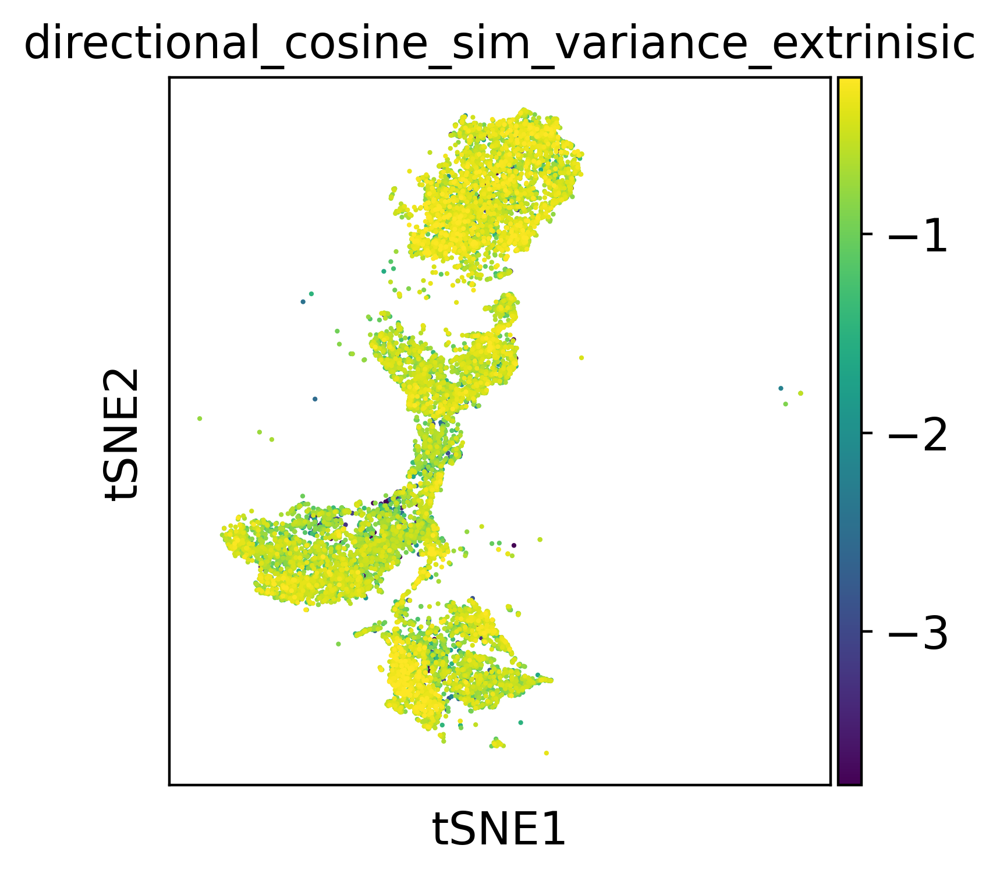

In [24]:
if dataset=="hindbrain":
    sc.pl.tsne(adata, color="directional_cosine_sim_variance_extrinisic",
        vmin="p1", 
        vmax="p99", 
        save="_extrinsic_" + dataset + model + ".png")
else:
    sc.pl.umap(
        adata, 
        color="directional_cosine_sim_variance_extrinisic",
        vmin="p1", 
        vmax="p99", 
        save="_extrinsic_" + dataset + model + ".png"
    )

In [28]:
import scib

scib.metrics.cluster_optimal_resolution(adata, cluster_key="cluster", label_key="clusters")
print(f"nmi: {scib.metrics.nmi(adata, group1='cluster', group2='clusters')}")
print(f"ari: {scib.me.ari(adata, group1='cluster', group2='clusters')}")
print(f"asw: {scib.me.silhouette(adata, group_key='clusters', embed='X_' + model + '_opt_active')}")
print(f"cluster avg: {(scib.metrics.nmi(adata, group1='cluster', group2='clusters')+scib.me.ari(adata, group1='cluster', group2='clusters')+scib.me.silhouette(adata, group_key='clusters', embed='X_' + model + '_opt_active'))/3}")
print(f"metrics avg: {(np.mean(vel_conf)+scib.metrics.nmi(adata, group1='cluster', group2='clusters')+scib.me.ari(adata, group1='cluster', group2='clusters')+scib.me.silhouette(adata, group_key='clusters', embed='X_' + model + '_opt_active'))/4}")

ValueError: column clusters is not in obs

In [29]:
#make dictionary of metrics for plotting
import scib

scib.metrics.cluster_optimal_resolution(adata, cluster_key="cluster", label_key=cell_column)
metrics={}
metrics["nmi"] = scib.me.nmi(adata, group1="cluster", group2=cell_column)
metrics["ari"] = scib.me.ari(adata, group1="cluster", group2=cell_column)
metrics["asw"] = scib.me.silhouette(adata, group_key=cell_column, embed="X_" + model + "_opt_active")
metrics["mean_vel_conf"]=np.mean(vel_conf)
metrics["vel_conf"]=vel_conf
metrics["clust_avg"] = (scib.metrics.nmi(adata, group1="cluster", group2=cell_column)+scib.me.ari(adata, group1="cluster", group2=cell_column)+scib.me.silhouette(adata, group_key=cell_column, embed="X_" + model + "_opt_active"))/3,
metrics["metrics_avg"] = (np.mean(vel_conf)+scib.metrics.nmi(adata, group1="cluster", group2=cell_column)+scib.me.ari(adata, group1="cluster", group2=cell_column)+scib.me.silhouette(adata, group_key=cell_column, embed="X_" + model + "_opt_active"))/4

resolution: 0.1, nmi: 0.6695007190926248
resolution: 0.2, nmi: 0.6361840971871595
resolution: 0.3, nmi: 0.5639765331946612
resolution: 0.4, nmi: 0.5471662482595404
resolution: 0.5, nmi: 0.5384799395816248
resolution: 0.6, nmi: 0.523323984992413
resolution: 0.7, nmi: 0.5182714403957448
resolution: 0.8, nmi: 0.5101621838486489
resolution: 0.9, nmi: 0.5065701155374739
resolution: 1.0, nmi: 0.5057415149087384
resolution: 1.1, nmi: 0.4972147536202235
resolution: 1.2, nmi: 0.49335607869130105
resolution: 1.3, nmi: 0.4855210391508363
resolution: 1.4, nmi: 0.4859632481723904
resolution: 1.5, nmi: 0.47909899847622717
resolution: 1.6, nmi: 0.4792049109486718
resolution: 1.7, nmi: 0.478934337377034
resolution: 1.8, nmi: 0.4766196263759937
resolution: 1.9, nmi: 0.47320190457431366
resolution: 2.0, nmi: 0.4691315322867144
optimised clustering against Celltype
optimal cluster resolution: 0.1
optimal score: 0.6695007190926248


/tmp/ipykernel_30203/3514359728.py:6: DeprecationWarning: Keyword argument 'group1' has been deprecated in favour of 'cluster_key'. 'group1' will be removed in a future version.
  metrics["nmi"] = scib.me.nmi(adata, group1="cluster", group2=cell_column)
/tmp/ipykernel_30203/3514359728.py:6: DeprecationWarning: Keyword argument 'group2' has been deprecated in favour of 'label_key'. 'group2' will be removed in a future version.
  metrics["nmi"] = scib.me.nmi(adata, group1="cluster", group2=cell_column)
/tmp/ipykernel_30203/3514359728.py:7: DeprecationWarning: Keyword argument 'group1' has been deprecated in favour of 'cluster_key'. 'group1' will be removed in a future version.
  metrics["ari"] = scib.me.ari(adata, group1="cluster", group2=cell_column)
/tmp/ipykernel_30203/3514359728.py:7: DeprecationWarning: Keyword argument 'group2' has been deprecated in favour of 'label_key'. 'group2' will be removed in a future version.
  metrics["ari"] = scib.me.ari(adata, group1="cluster", group2=c

In [35]:
#save dictionary to pkl
import pickle
with open(metrics_dict, 'rb') as f:
    metrics = pickle.load(f)

In [30]:
metrics["vel_conf"]=vel_conf

In [31]:
metrics

{'vel_conf': index
 AAACCTGAGAGGGATA    0.930984
 AAACCTGAGCCTTGAT    0.929462
 AAACCTGAGGCAATTA    0.927955
 AAACCTGCATCATCCC    0.953789
 AAACCTGGTAAGTGGC    0.949060
                       ...   
 TTTGTCAAGTGACATA    0.920931
 TTTGTCAAGTGTGGCA    0.908538
 TTTGTCAGTTGTTTGG    0.903698
 TTTGTCATCGAATGCT    0.948592
 TTTGTCATCTGTTTGT    0.900042
 Name: velocity_confidence, Length: 3696, dtype: float64,
 'nmi': 0.7295501909305186,
 'ari': 0.6342208398743878,
 'asw': 0.6008566841483116,
 'clust_avg': (0.6548759049844061,),
 'metrics_avg': 0.7158480004713306}

In [32]:
#save dictionary to pkl
import pickle
with open(metrics_dict, 'wb') as f:
    pickle.dump(metrics, f)

In [30]:
#Compute MSE

import pandas as pd
pred=vae.get_expression_fit()
pred_s=pred[0]
pred_u=pred[1]
GT_s=adata.layers["Ms"]
GT_u=adata.layers["Mu"]
MSE_s=np.mean((pred_s-GT_s)**2, axis=0)
MSE_u=np.mean((pred_u-GT_u)**2, axis=0)

MSE=pd.DataFrame([MSE_s,MSE_u]).T

MSE.to_csv("output/" + dataset + "/" + model + "/" + "MSE_.csv")

In [17]:
adata.write(adata_output)

Latent enrichment

In [33]:
from itertools import compress
vae.latent_directions(adata=adata)
active_terms_idx=list(compress(np.arange(len(adata.uns["terms"])), vae.nonzero_terms()))
scores_ct = vae.latent_enrich(cell_column, use_directions=True, select_terms = active_terms_idx, adata=adata, exact=True)

/home/mo/miniconda3/envs/ivelo/lib/python3.8/site-packages/anndata-0.8.0-py3.8.egg/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph'] that happens to be dimensioned at n_obs×n_obs (13501×13501).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/home/mo/miniconda3/envs/ivelo/lib/python3.8/site-packages/anndata-0.8.0-py3.8.egg/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['velocity_graph_neg'] that happens to be dimensioned at n_obs×n_obs (13501×13501).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/home/mo/miniconda3/envs/ivelo/lib/python3.8/site-packages/anndata-0.8.0-py3.8.egg/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['velocities_velovi_0_graph'] that happens to be dimensioned at n_ob

INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/home/mo/miniconda3/envs/ivelo/lib/python3.8/site-packages/anndata-0.8.0-py3.8.egg/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
INFO     Received view of anndata, making copy.                                                                    
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
INFO     Received view of anndata, making copy.                         

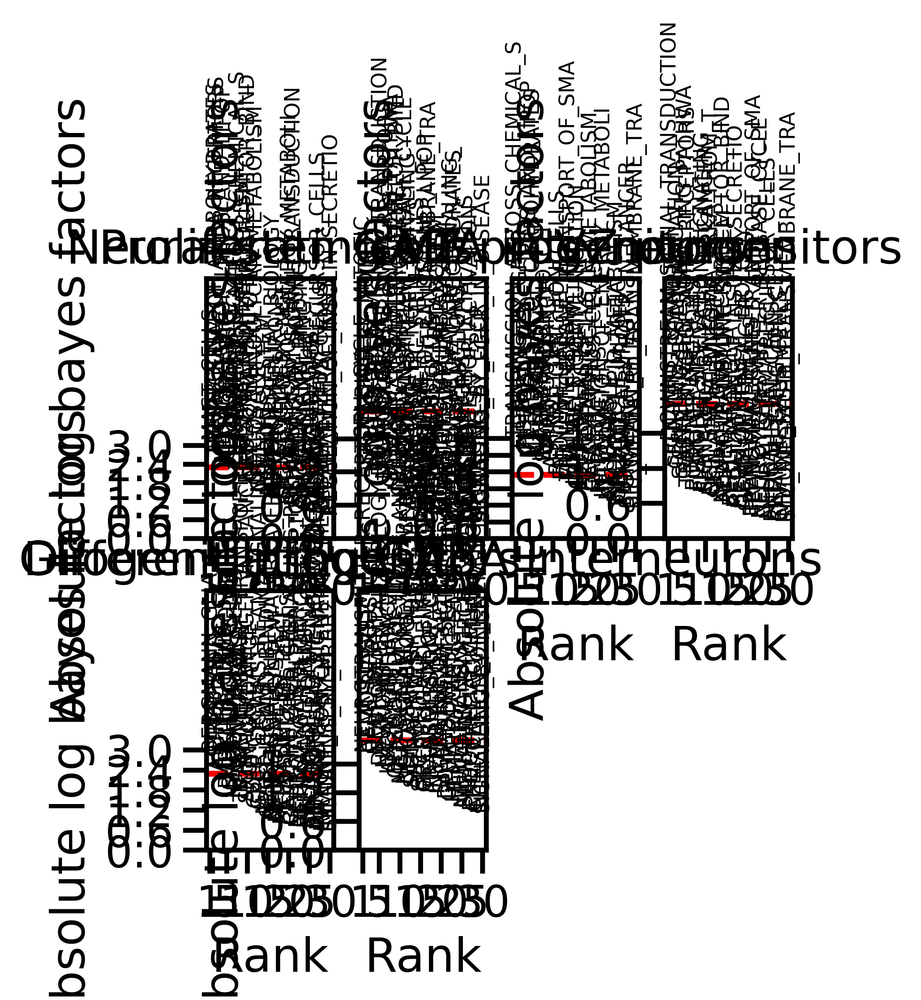

In [34]:
active_terms=list(compress(adata.uns["terms"], vae.nonzero_terms()))
fig = sca.plotting.plot_abs_bfs(adata, n_cols=4, terms=active_terms, scale_y=2.6, yt_step=0.6)

In [35]:
fig.set_size_inches(24, 30)
fig

In [36]:
fig.savefig("figures/" + dataset + "/" + model + "/latent_enrich.png")

### Save latent enrich results to dictionary

In [37]:
import collections
top_gps_per_cell = collections.defaultdict(dict)
for cell_type in adata.uns["bf_scores"].keys():
    mask=abs(adata.uns["bf_scores"][cell_type]["bf"])>=2.3
    GP_index=np.arange(len(active_terms))
    sig_GP_index=list(compress(GP_index, mask))
    top_gps_per_cell[cell_type]["terms"] = np.array(active_terms)[sig_GP_index]
    top_gps_per_cell[cell_type]["terms"] = np.array(active_terms)[sig_GP_index]
    top_gps_per_cell[cell_type]["bf_scores"] = adata.uns["bf_scores"][cell_type]["bf"]
    top_gps_per_cell[cell_type]["bf_scores_sig"] = adata.uns["bf_scores"][cell_type]["bf"][mask]
    top_gps_per_cell[cell_type]["sig_GP_index"] = sig_GP_index

In [31]:
import collections

#add active terms and bf_scores into df

top_n_terms=[]
for cell_type in adata.uns["bf_scores"].keys():
    bf_scores=adata.uns["bf_scores"][cell_type]["bf"]
    d = {'active_terms': active_terms, 'bf_scores': bf_scores}
    df=pd.DataFrame(data=d, columns=["active_terms", "bf_scores"])
    top_n_df=df.sort_values(by=["bf_scores"], ascending=False)[:10]
    top_n_terms.extend(top_n_df["active_terms"])

top_n_terms = list(set(top_n_terms)) #100

In [32]:
#from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

acc=[]
idx = [active_terms.index(term) for term in top_n_terms]
directions=adata.uns["directions"]
directions=directions[directions!=0]
latents = (adata.obsm["X_" + model + "_opt_active"]*directions)[:, idx]
labels=pd.Categorical(adata.obs["clusters"]).codes
#for i in range(latents.shape[1]):
#    X_train, X_test, y_train, y_test = train_test_split(latents[:,i].reshape(-1, 1), labels, test_size=.2)
#    clf = GradientBoostingClassifier().fit(latents[:,i].reshape(-1, 1), labels)
#    pred=clf.predict(latents[:,i].reshape(-1, 1))
#    acc.append(clf.score(latents[:,i].reshape(-1, 1), labels))

X_train, X_test, y_train, y_test = train_test_split(latents, labels, test_size=0.2)
data_dmatrix = xgb.DMatrix(data=X_train,label=y_train)

def fit(x):
    params = {'objective':'multi:softmax',
              'num_class': len(list(set(labels))),
              'learning_rate':int(x[0]),
              #'colsample_bytree':int(x[1]),
              #'learning_rate':0.1,
              'min_child_weight':1,
              'max_depth':5,
             
             }
    xgb_cv = xgb.cv(dtrain=data_dmatrix, params=params, early_stopping_rounds=50,
    nfold=5, seed=42)
    return xgb_cv[-1:].values[0]

grid = pd.DataFrame({'learning_rate':[0.01, 0.05, 0.1], 
                     #'colsample_bytree':np.repeat([0.6,0.7,0.8,0.9],4), 
                     #'min_child_weight':np.repeat([1,2,3],3)
                     #'learning_rate':np.repeat([0.01,0.05,0.1],3),
                     #'subsample':np.repeat([0.1,0.3],3)
                    })

grid[['train-mean','train-std',
'test-mean','test-std']] = grid.apply(fit,axis=1,result_type='expand')


In [33]:
grid

,learning_rate,train-mean,train-std,test-mean,test-std
0,0.01,2.639057,0.0,2.639057,0.0
1,0.05,2.639057,0.0,2.639057,0.0
2,0.10,2.639057,0.0,2.639057,0.0


In [34]:
clf = XGBClassifier(objective='multi:softmax',
                           learning_rate = 0.1,
                           min_child_weight = 1,
                           max_depth = 5,
                   
                   )

clf.fit(X_train, y_train)

preds = clf.predict(X_test)
accuracy = accuracy_score(y_test, preds)
print(accuracy)
top_gps_per_cell["XGB_acc"] = accuracy

0.9146757679180887


In [35]:
#save dictionary to pkl
import pickle
with open('output/' + dataset + '/' + model + '/GP_analysis.pkl', 'wb') as f:
    pickle.dump(top_gps_per_cell, f)

Plot latent space to visualize gene programs

In [18]:
#get latent directions
vae.latent_directions()

In [19]:
terms = adata.uns['terms']
terms

['ALPHA_CELLS',
 'BETA_CELLS',
 'DELTA_CELLS',
 'ENDOTHELIAL_CELLS',
 'ENTEROENDOCRINE_CELLS',
 'EPITHELIAL_CELLS',
 'FIBROBLASTS',
 'HEPATOCYTES',
 'INTERNEURONS',
 'MAST_CELLS',
 'NEUROBLASTS',
 'NEURONS',
 'PURKINJE_NEURONS',
 'SIGNALLING_BY_NGF',
 'DEVELOPMENTAL_BIOLOGY',
 'CELL_CYCLE',
 'GASTRIN_CREB_SIGNALLING_PATHWA',
 'TRANSMISSION_ACROSS_CHEMICAL_S',
 'NEURONAL_SYSTEM',
 'SIGNALING_BY_GPCR',
 'CLASS_A1_RHODOPSIN_LIKE_RECEPT',
 'INTEGRATION_OF_ENERGY_METABOLI',
 'CELL_CYCLE_MITOTIC',
 'NEUROTRANSMITTER_RECEPTOR_BIND',
 'CELL_CYCLE_CHECKPOINTS',
 'DIABETES_PATHWAYS',
 'TRANSMEMBRANE_TRANSPORT_OF_SMA',
 'METABOLISM_OF_PROTEINS',
 'G1_S_TRANSITION',
 'AXON_GUIDANCE',
 'REGULATION_OF_INSULIN_SECRETIO',
 'SLC_MEDIATED_TRANSMEMBRANE_TRA',
 'GPCR_DOWNSTREAM_SIGNALING',
 'G_ALPHA_I_SIGNALLING_EVENTS',
 'G_ALPHA_S_SIGNALLING_EVENTS',
 'SYNTHESIS_OF_DNA',
 'MITOTIC_G1_G1_S_PHASES',
 'MITOTIC_M_M_G1_PHASES',
 'GPCR_LIGAND_BINDING',
 'CHROMOSOME_MAINTENANCE',
 'METABOLISM_OF_LIPIDS_AND_LIP

In [20]:
select_terms = ['CELL_CYCLE', 'DEVELOPMENTAL_BIOLOGY',]
idx = [terms.index(term) for term in select_terms]

In [21]:
latents = (adata.obsm["latent"]*adata.uns['directions'])[:, idx]

In [22]:
adata.obs['CELL_CYCLE'] = latents[:, 0]
adata.obs['DEVELOPMENTAL_BIOLOGY'] = latents[:, 1]

#sc.pl.scatter(adata, x='CLASS_A1_RHODOPSIN_LIKE_RECEPT', y='CHROMOSOME_MAINTENANCE', color='clusters', groups="Epsilon", size=10)#, save="2.png")

Umap of GPs

/home/chels/.local/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:452: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  pl.colorbar(


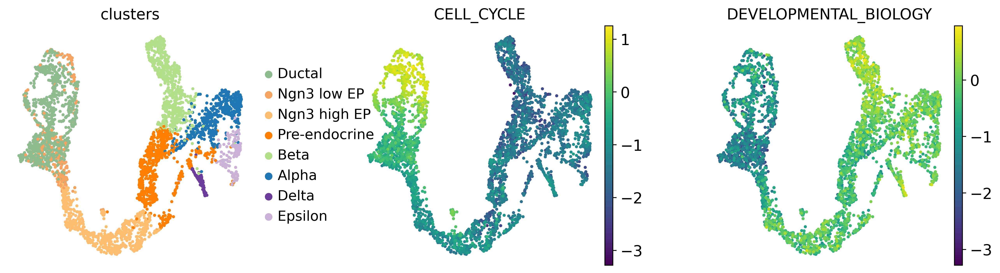

In [23]:
sc.pl.umap(adata, color=['clusters', 'CELL_CYCLE', "DEVELOPMENTAL_BIOLOGY"], frameon=False, wspace=0.3)

Get genes for each term ranked by absolute weight in decoder

In [157]:
terms=["SIGNALING_BY_GPCR","CELL_CYCLE", "NEURONAL_SYSTEM","GPCR_DOWNSTREAM_SIGNALING","ADAPTIVE_IMMUNE_SYSTEM","MITOTIC_PROMETAPHASE", "G_ALPHA_I_SIGNALLING_EVENTS", "DIABETES_PATHWAYS","GPCR_LIGAND_BINDING","CLASS_A1_RHODOPSIN_LIKE_RECEPT","CHROMOSOME_MAINTENANCE"]
for term in terms:
    df=vae.term_genes(term)
    df.to_csv(f"output/ranked_genes_{term}.csv")


### Analysis of saved model

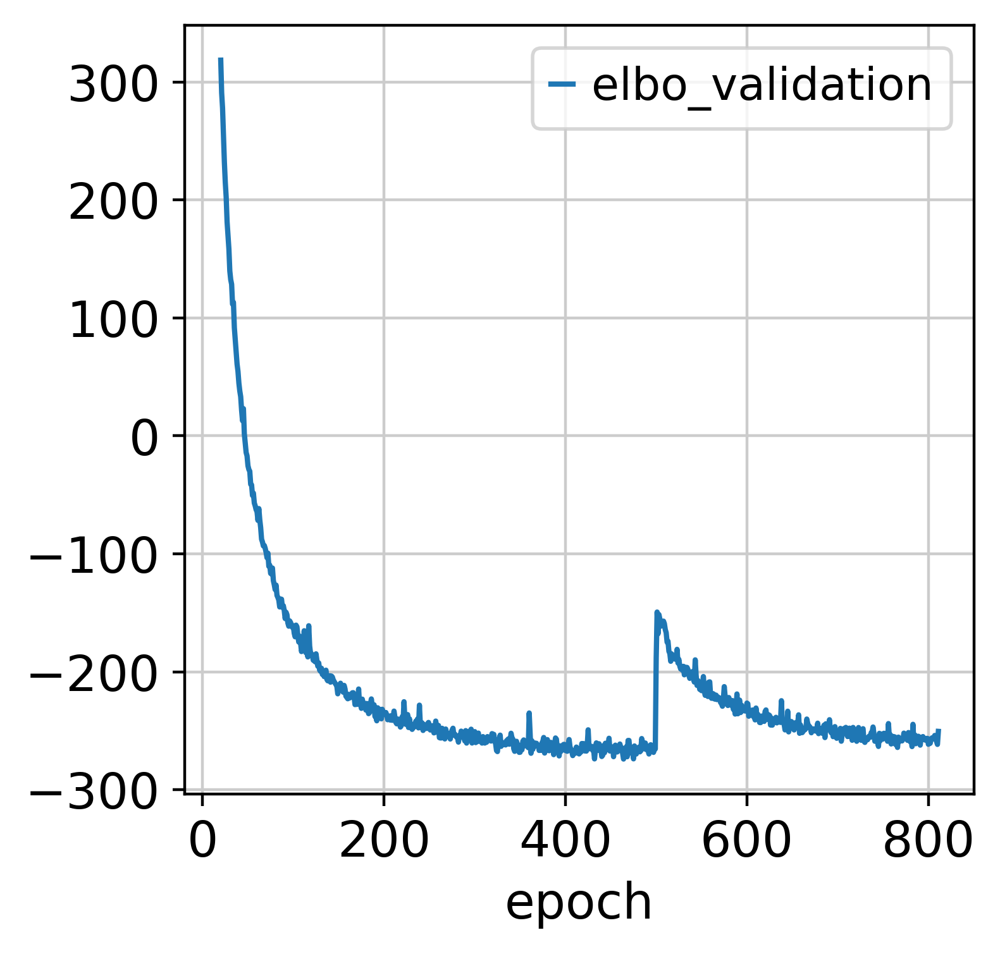

In [24]:
fig, ax = plt.subplots()
#vae.history["elbo_train"].iloc[20:].plot(ax=ax, label="train")
vae.history["elbo_validation"].iloc[20:].plot(ax=ax, label="validation")
plt.legend()

Compare model to velovi

In [25]:
#Compare the MSE for unspliced and spliced counts between Velo_interpret and original 

import pandas as pd
pred=vae.get_expression_fit()
pred_s=pred[0]
pred_u=pred[1]
GT_s=adata.layers["Ms"]
GT_u=adata.layers["Mu"]
MSE_s=np.mean((pred_s-GT_s)**2, axis=0)
MSE_u=np.mean((pred_u-GT_u)**2, axis=0)

ivelo_MSE=pd.DataFrame([MSE_s,MSE_u]).T

ivelo_MSE.to_csv("MSE_ivelo.csv")

# #Read in saved MSE from velovi_orig
# velo_orig_MSE=pd.read_csv("MSE_velovi_orig.csv", index_col="index")

# #Calculate log10 MSE ratios
# log10MSE_s=np.log10(velo_orig_MSE["0"]/velo_interpret_MSE[0])
# log10MSE_u=np.log10(velo_orig_MSE["1"]/velo_interpret_MSE[1])
# log10MSE_s=log10MSE_s.dropna()
# log10MSE_u=log10MSE_u.dropna()

# #Combine MSE for spliced and unspliced into 1 dataframe
# MSE_combined=pd.DataFrame([log10MSE_s,log10MSE_u]).T
# MSE_combined=MSE_combined.rename(columns={0:"spliced",1:"unspliced"})

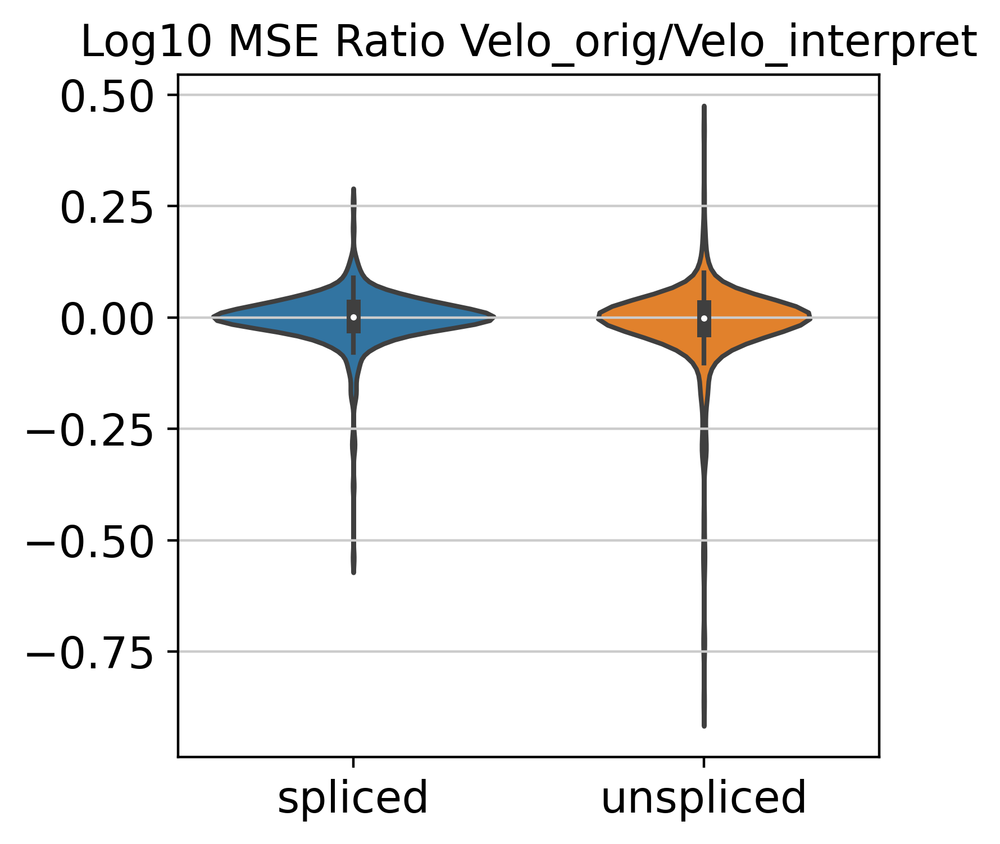

In [51]:
#Get violin plot of log10 MSEs
ax=sns.violinplot(data=MSE_combined)
ax.set_title("Log10 MSE Ratio Velo_orig/Velo_interpret")
MSE_fig=ax.get_figure()
#MSE_fig.savefig("figures/decoder2/log10MSE.png") 

Add outputs of velo_interpret to adata

In [25]:
def add_velovi_outputs_to_adata(adata, vae):
    latent_time = vae.get_latent_time(n_samples=25)
    velocities = vae.get_velocity(n_samples=25, velo_statistic="mean")

    t = latent_time
    scaling = 20 / t.max(0)

    adata.layers["velocity"] = velocities / scaling
    adata.layers["latent_time_velovi"] = latent_time

    adata.var["fit_alpha"] = vae.get_rates()["alpha"] / scaling
    adata.var["fit_beta"] = vae.get_rates()["beta"] / scaling
    adata.var["fit_gamma"] = vae.get_rates()["gamma"] / scaling
    adata.var["fit_t_"] = (
        torch.nn.functional.softplus(vae.module.switch_time_unconstr)
        .detach()
        .cpu()
        .numpy()
    ) * scaling
    adata.layers["fit_t"] = latent_time.values * scaling[np.newaxis, :]
    adata.var['fit_scaling'] = 1.0

add_velovi_outputs_to_adata(adata, vae)

In [27]:
#get velocity confidence 
scv.tl.velocity_graph(adata)
scv.tl.velocity_confidence(adata)

computing velocity graph (using 1/8 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:08) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


In [ ]:
#save velocity confidene results
velo_int_s_vc=pd.DataFrame(adata.obs["velocity_confidence"])
velo_int_s_vc.to_csv("vel_conf_Velo_Int_S.csv")

In [46]:
velo_orig_vc=pd.read_csv("vel_conf_veloVI.csv", index_col="index")
velo_orig_vc=velo_orig_vc.rename(columns={"velocity_confidence":"vc_veloVI"})
scvelo_vc=pd.read_csv("vel_conf_scVelo.csv", index_col="index")
scvelo_vc=scvelo_vc.rename(columns={"velocity_confidence":"vc_scvelo"})
# velo_int_s_vc=pd.read_csv("vel_conf_Velo_Int_S.csv", index_col="index")
# velo_int_s_vc=velo_int_s_vc.rename(columns={"velocity_confidence":"vc_velo_interpret_single"})
velo_int_d_vc=pd.DataFrame(adata.obs["velocity_confidence"])
velo_int_d_vc=velo_int_d_vc.rename(columns={"velocity_confidence":"vc_velo_interpret_single"})

In [47]:
vc_combined=pd.concat([scvelo_vc,velo_orig_vc,velo_int_d_vc],axis=1)

In [48]:
vc_combined

,vc_scvelo,vc_veloVI,vc_velo_interpret_single
index,,,
AAACCTGAGAGGGATA,0.769216,0.900101,0.896680
AAACCTGAGCCTTGAT,0.792310,0.910085,0.897434
AAACCTGAGGCAATTA,0.733762,0.840806,0.873588
AAACCTGCATCATCCC,0.746999,0.881598,0.905368
AAACCTGGTAAGTGGC,0.775375,0.905970,0.911187
...,...,...,...
TTTGTCAAGTGACATA,0.589383,0.853201,0.861832
TTTGTCAAGTGTGGCA,0.717359,0.838502,0.834472
TTTGTCAGTTGTTTGG,0.657952,0.858520,0.820456


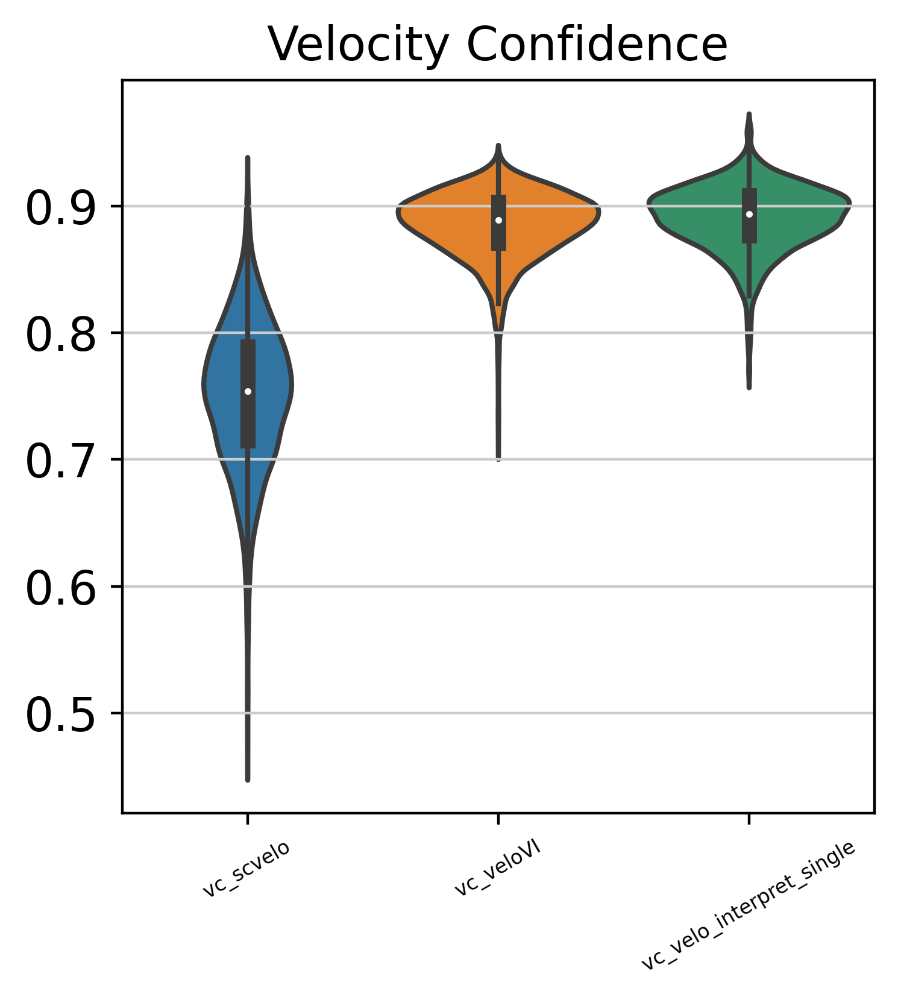

In [49]:
#Get violin plot of velocity confidence
ax=sns.violinplot(data=vc_combined)
ax.set_xticklabels(ax.get_xticklabels(),rotation=30, size = 6)
ax.set_title("Velocity Confidence")
fig=ax.get_figure()
#fig.savefig("figures/vel_conf.png") 

Get Velocity graph

In [26]:
scv.tl.velocity_graph(adata)

computing velocity graph (using 1/8 cores)


  0%|          | 0/3696 [00:00<?, ?cells/s]

    finished (0:00:14) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ./figures/scvelo_velocity_embedding.pdf


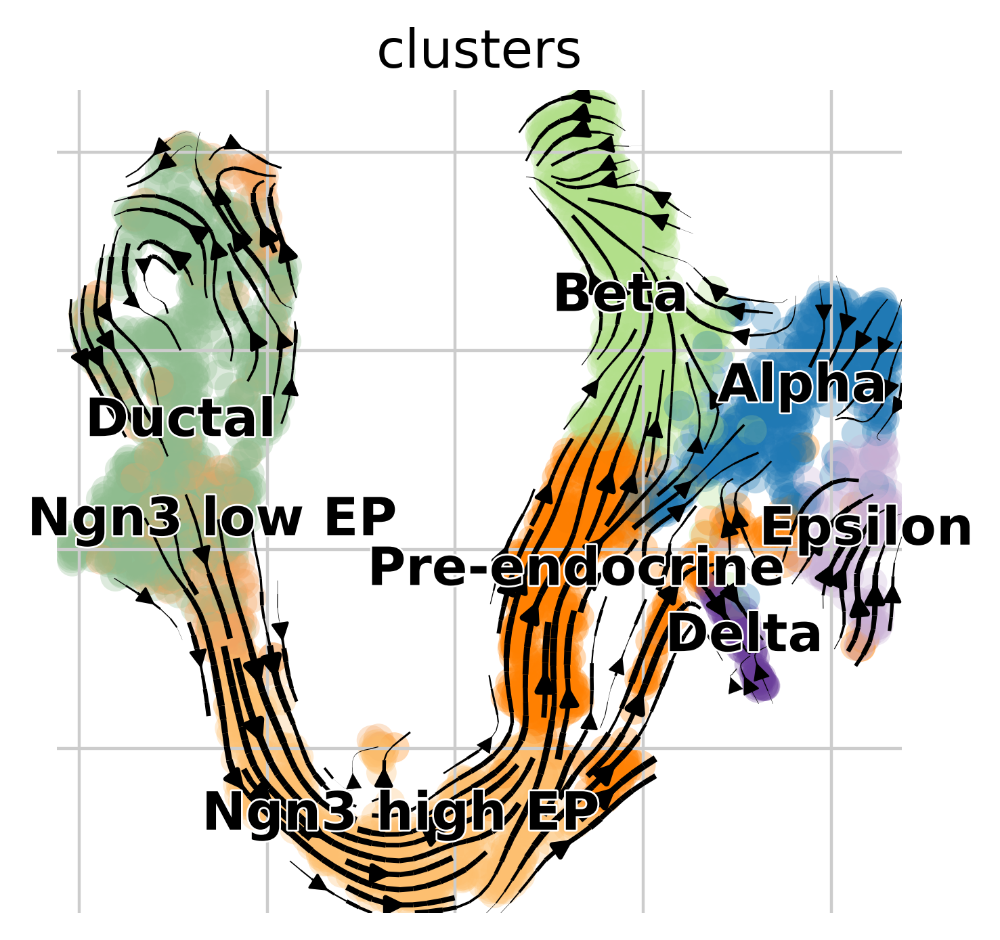

In [27]:
scv.pl.velocity_embedding_stream(adata, basis='umap', save="velocity_embedding")

/home/chels/thesis/repos/scvelo/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


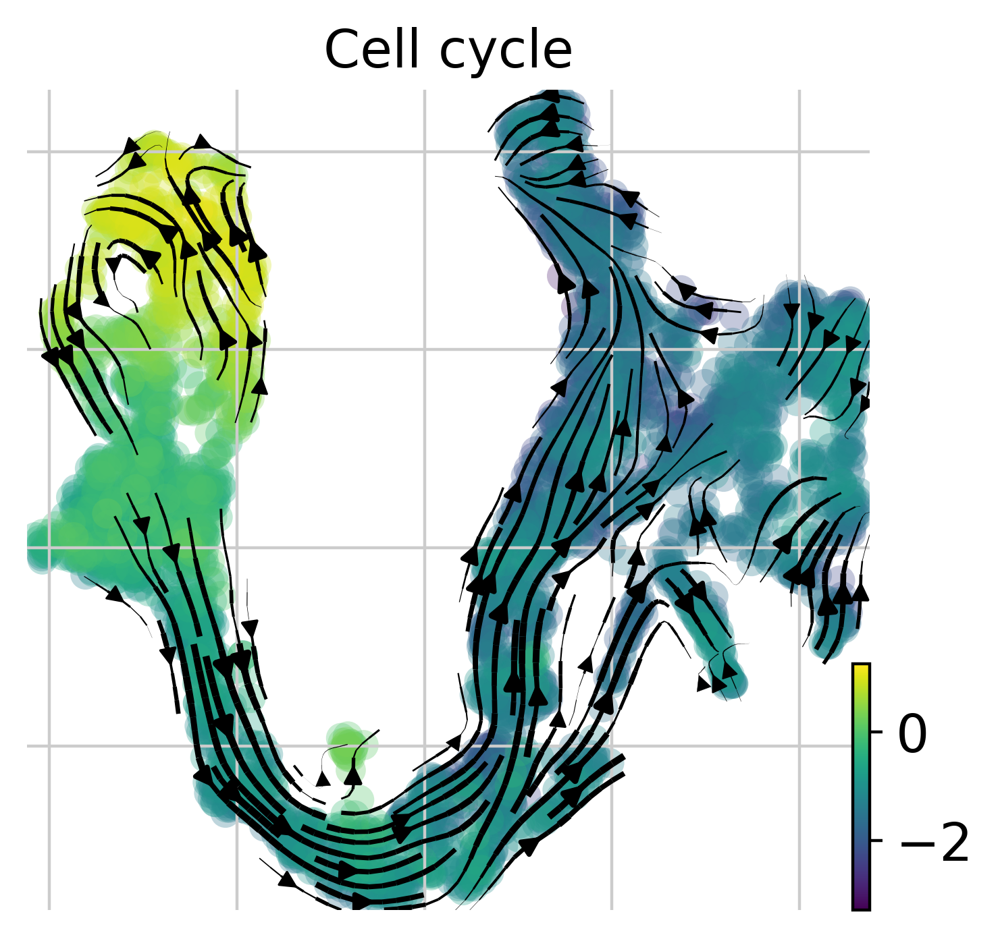

In [28]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color="CELL_CYCLE", title="Cell cycle")

In [ ]:
scv.pl.velocity_embedding_stream(ref_query, basis='umap', color="Regulation of Beta cell development")

Intrinsic uncertainty

In [19]:
uncertainty_df, _ = vae.get_directional_uncertainty(n_samples=100)
uncertainty_df.head()

INFO     velovi: Sampling from model...                                                                            
INFO     velovi: Computing the uncertainties...                                                                    


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
/home/chels/anaconda3/envs/thesis/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/chels/anaconda3/envs/thesis/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/chels/an

,directional_variance,directional_difference,directional_cosine_sim_variance,directional_cosine_sim_difference,directional_cosine_sim_mean
index,,,,,
AAACCTGAGAGGGATA,0.003387,0.182226,0.001933,0.135782,0.666899
AAACCTGAGCCTTGAT,0.005017,0.232567,0.002823,0.175187,0.657598
AAACCTGAGGCAATTA,0.004597,0.242510,0.002484,0.179326,0.677766
AAACCTGCATCATCCC,0.004714,0.210303,0.002611,0.155247,0.676280
AAACCTGGTAAGTGGC,0.004365,0.202090,0.002411,0.148144,0.676280


In [20]:
for c in uncertainty_df.columns:
    adata.obs[c] = np.log10(uncertainty_df[c].values)

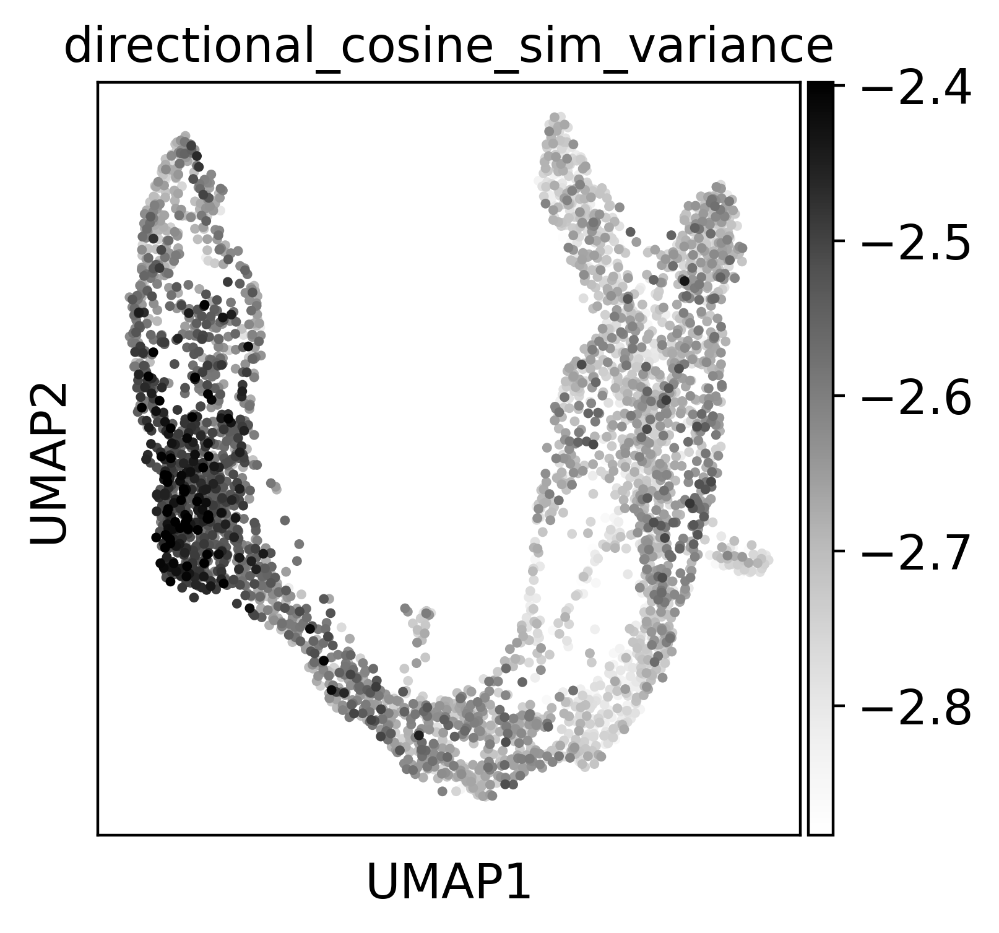

In [22]:
sc.pl.umap(
    adata, 
    color="directional_cosine_sim_variance",
    cmap="Greys",
    vmin="p1",
    vmax="p99",
    save="intrinsic_uncertainty.png"
)

Extrinsic uncertainty

In [23]:
def compute_extrinisic_uncertainty(adata, vae, n_samples=25) -> pd.DataFrame:
    from velovi._model import _compute_directional_statistics_tensor
    from scvi.utils import track
    from contextlib import redirect_stdout
    import io

    extrapolated_cells_list = []
    for i in track(range(n_samples)):
        with io.StringIO() as buf, redirect_stdout(buf):
            vkey = "velocities_velovi_{i}".format(i=i)
            v = vae.get_velocity(n_samples=1, velo_statistic="mean")
            adata.layers[vkey] = v
            scv.tl.velocity_graph(adata, vkey=vkey, sqrt_transform=False, approx=True)
            t_mat = scv.utils.get_transition_matrix(
                adata, vkey=vkey, self_transitions=True, use_negative_cosines=True
            )
            extrapolated_cells = np.asarray(t_mat @ adata.layers["Ms"])
            extrapolated_cells_list.append(extrapolated_cells)
    extrapolated_cells = np.stack(extrapolated_cells_list)
    df = _compute_directional_statistics_tensor(extrapolated_cells, n_jobs=-1, n_cells=adata.n_obs)
    return df

In [24]:
ext_uncertainty_df = compute_extrinisic_uncertainty(adata, vae)

Working...:   0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:   4%|▍         | 1/25 [01:02<25:07, 62.83s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:   8%|▊         | 2/25 [01:21<14:07, 36.85s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  12%|█▏        | 3/25 [01:38<10:12, 27.83s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  16%|█▌        | 4/25 [01:55<08:15, 23.58s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  20%|██        | 5/25 [02:14<07:14, 21.74s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  24%|██▍       | 6/25 [02:32<06:31, 20.59s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  28%|██▊       | 7/25 [02:51<05:59, 19.99s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  32%|███▏      | 8/25 [03:09<05:32, 19.55s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  36%|███▌      | 9/25 [03:59<07:40, 28.81s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  40%|████      | 10/25 [04:15<06:14, 24.96s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  44%|████▍     | 11/25 [04:32<05:14, 22.44s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  48%|████▊     | 12/25 [04:48<04:27, 20.55s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  52%|█████▏    | 13/25 [05:04<03:51, 19.27s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  56%|█████▌    | 14/25 [05:20<03:21, 18.34s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  60%|██████    | 15/25 [05:37<02:57, 17.71s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  64%|██████▍   | 16/25 [05:54<02:39, 17.67s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  68%|██████▊   | 17/25 [06:11<02:19, 17.41s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  72%|███████▏  | 18/25 [06:52<02:52, 24.61s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  76%|███████▌  | 19/25 [07:10<02:14, 22.40s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  80%|████████  | 20/25 [07:27<01:44, 20.94s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  84%|████████▍ | 21/25 [07:44<01:19, 19.76s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  88%|████████▊ | 22/25 [08:02<00:57, 19.15s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  92%|█████████▏| 23/25 [08:19<00:37, 18.54s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...:  96%|█████████▌| 24/25 [08:35<00:17, 17.94s/it]

  0%|          | 0/3696 [00:00<?, ?cells/s]

Working...: 100%|██████████| 25/25 [08:52<00:00, 21.31s/it]
INFO     velovi: Computing the uncertainties...                                                                    


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
Global seed set to 0
/home/chels/anaconda3/envs/thesis/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/chels/anaconda3/envs/thesis/lib/python3.8/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/chels/an

In [36]:
for c in ext_uncertainty_df[0].columns:
    adata.obs[c + "_extrinsic"] = np.log10(ext_uncertainty_df[0][c].values)

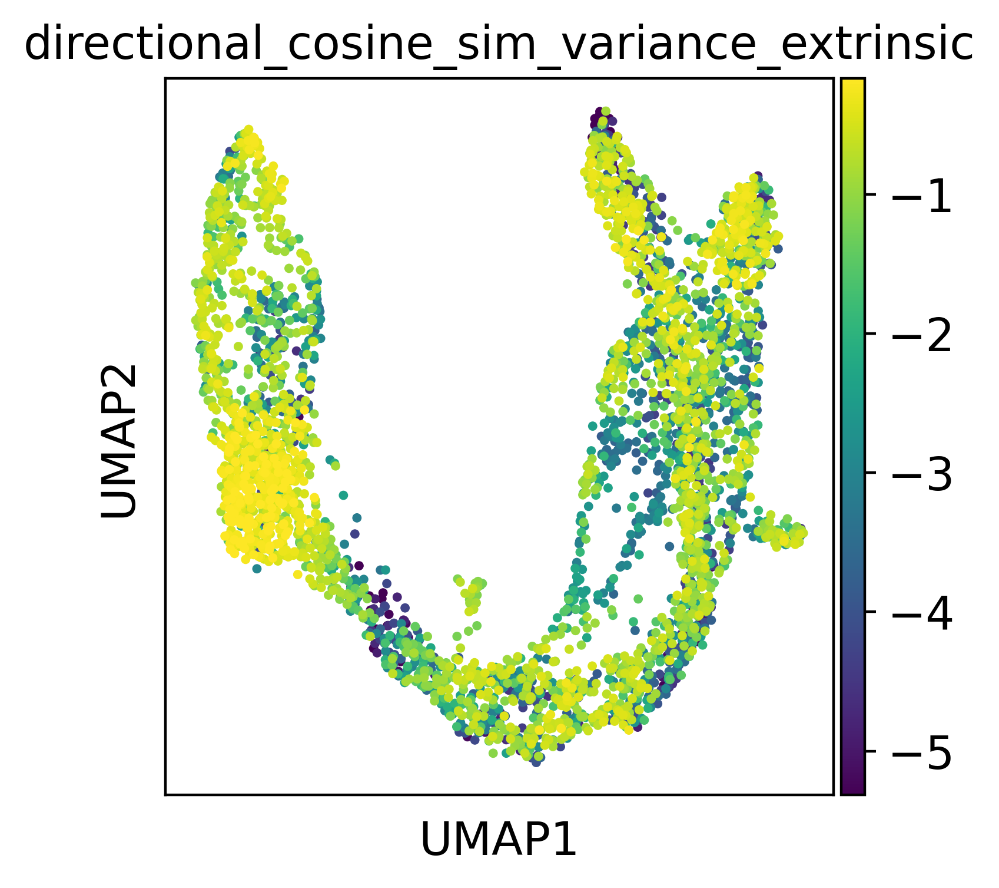

In [37]:
sc.pl.umap(
    adata, 
    color="directional_cosine_sim_variance_extrinsic",
    vmin="p1", 
    vmax="p99", 
    save="extrinsic_uncertainty.png"
)

Permutation score

In [38]:
perm_df, _ = vae.get_permutation_scores(labels_key="clusters")
adata.var["permutation_score"] = perm_df.max(1).values

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             
INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


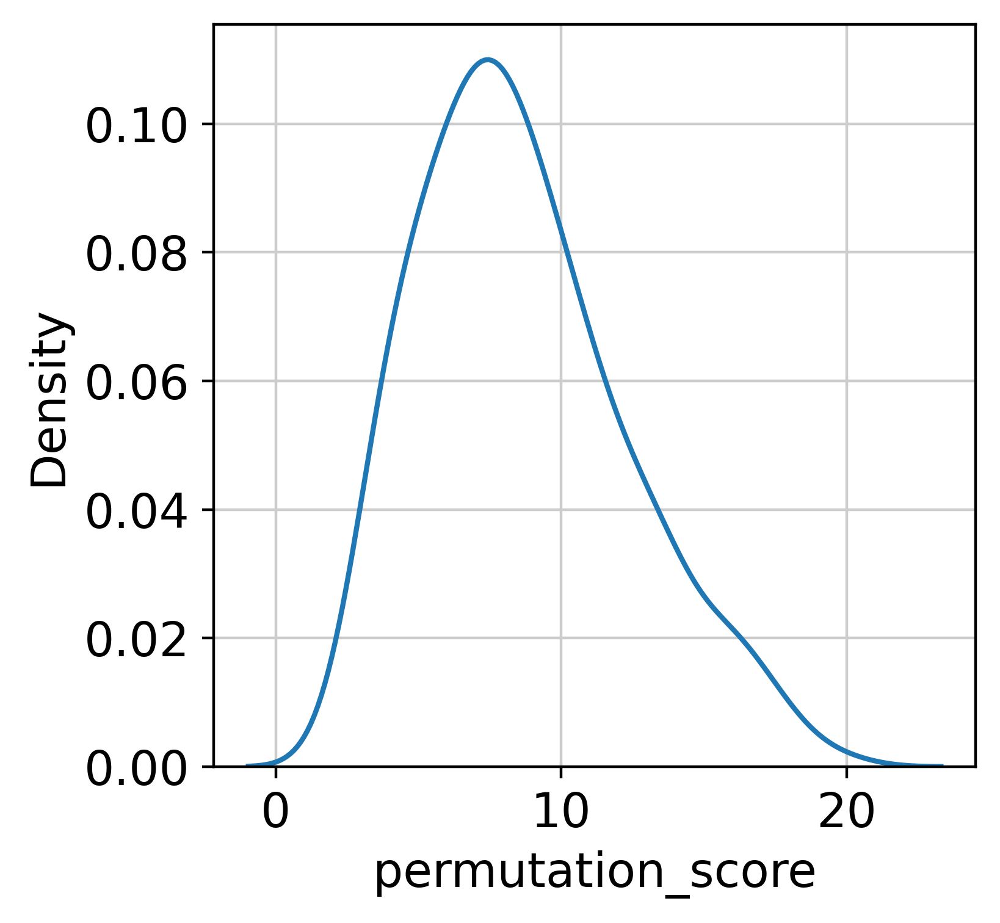

In [42]:
perm_score=sns.kdeplot(data=adata.var, x="permutation_score")
perm_score_fig=perm_score.get_figure()
perm_score_fig.savefig("figures/permutation_score.png") 

In [ ]:
#Sunday
#run without soft mask
#check if GPs are decreasing (look at GPs not included in original pancreas app to expimap)
#get latent directions
#plot GPs
#Compare with orig velovi

#Monday
#Apply other decoder
